# Attack V10: FGSM/PGD White-Box Sanity Check on V17 EoMT-DINOv3

This notebook tests whether **V17 EoMT-DINOv3** can be attacked by direct white-box gradient methods under the same small perturbation budget used by the trainable-generator attacks.

Why this exists:

- Attack V8: Feature-ASPP generator + targeted-background + feature loss did not reduce V17 global mIoU.
- Attack V9: Feature-ASPP generator + untargeted CE + margin loss also did not reduce V17 global mIoU.
- V10 is a diagnostic baseline: if PGD can reduce mIoU, then V8/V9 failed because the trainable generator/objective was weak. If PGD also fails, V17 is genuinely robust under this budget.

Methods:

- FGSM at `eps=2/255` and `eps=4/255`
- PGD at `eps=4/255`, 10 steps

This notebook is **not** a trainable adversarial model. It is a white-box sanity check.

Outputs:

- `attack_summary.csv`
- `per_class_iou.csv`
- visualizations for the strongest default attack condition
- backup to Drive


In [ ]:
!nvidia-smi

Sat May 16 10:57:39 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L4                      Off |   00000000:00:03.0 Off |                    0 |
| N/A   77C    P0             34W /   72W |    3492MiB /  23034MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%%bash
set -e
REPO=/content/CV-Assignment2-Group6
if [ ! -d "$REPO/.git" ]; then
  git clone -b segmentation https://github.com/linenmin/CV-Assignment2-Group6.git "$REPO"
else
  echo "Repo already exists; updating segmentation branch."
  cd "$REPO"
  git fetch origin segmentation
  git checkout segmentation
  git pull --ff-only origin segmentation
fi

echo "repo_commit=$(git -C $REPO rev-parse --short HEAD)"


Repo already exists; updating segmentation branch.
Your branch is up to date with 'origin/segmentation'.
Already up to date.
repo_commit=e803366


From https://github.com/linenmin/CV-Assignment2-Group6
 * branch            segmentation -> FETCH_HEAD
Already on 'segmentation'
From https://github.com/linenmin/CV-Assignment2-Group6
 * branch            segmentation -> FETCH_HEAD


In [ ]:
%%bash
set -e
# Stable Colab install for V17 EoMT-DINOv3.
# This runtime can break if NumPy/Pillow are partially upgraded, so pin and reinstall them explicitly.
python -m pip install -q --force-reinstall --no-cache-dir "numpy==2.0.2" "pandas==2.2.2" "pillow==11.3.0"
python -m pip install -q -U --no-cache-dir "transformers>=5.7.0" accelerate safetensors timm gdown matplotlib
# Re-pin after installing dependencies in case any package upgraded Pillow/NumPy behind our back.
python -m pip install -q --force-reinstall --no-cache-dir "numpy==2.0.2" "pandas==2.2.2" "pillow==11.3.0"

cd "/content/CV-Assignment2-Group6/Semantic segmentation"
python -m pip install -q -e .

python - <<'PY'
import numpy
import pandas
import PIL
import transformers
print('numpy:', numpy.__version__)
print('pandas:', pandas.__version__)
print('pillow:', PIL.__version__)
print('transformers:', transformers.__version__)
from transformers import AutoImageProcessor, EomtDinov3ForUniversalSegmentation
print('EomtDinov3ForUniversalSegmentation import OK')
PY


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.2/19.2 MB 393.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.7/12.7 MB 403.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 279.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 229.9/229.9 kB 402.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.1/510.1 kB 424.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 349.3/349.3 kB 395.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.2/19.2 MB 339.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.7/12.7 MB 312.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 407.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 229.9/229.9 kB 390.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

**Important after running the install cell**

If this runtime previously had Pillow / NumPy import errors, run:

`Runtime -> Restart session`

Then rerun the notebook from the top. This clears mixed Pillow files from memory.


In [ ]:
%%bash
set -e
REPO=/content/CV-Assignment2-Group6
DATA_LINK="$REPO/kul-computer-vision-ga-2-2026"
DRIVE_DATA=/content/drive/MyDrive/kul-computer-vision-ga-2-2026

if [ ! -e "$DATA_LINK" ]; then
  ln -s "$DRIVE_DATA" "$DATA_LINK"
else
  echo "Dataset link already exists."
fi

echo "Train images: $(ls "$DATA_LINK/train/img" | wc -l)"
echo "Test images: $(ls "$DATA_LINK/test/img" | wc -l)"


Dataset link already exists.
Train images: 749
Test images: 750


In [ ]:
# Locate or download the V17 EoMT-DINOv3 checkpoint.
from pathlib import Path
import shutil
import subprocess
import sys

PROJECT_ROOT = Path('/content/CV-Assignment2-Group6/Semantic segmentation')
V17_CKPT = PROJECT_ROOT / 'outputs/checkpoints/eomt_dinov3_v17_merge_val_lr1e5/best'
REQUIRED = ['config.json', 'metrics.json', 'model.safetensors', 'preprocessor_config.json']
DRIVE_FOLDER_ID = '1ImiIyTvxtMVIlrptKXfl3w3qF5CBdPCG'


def has_checkpoint(path: Path) -> bool:
    return all((path / name).exists() for name in REQUIRED)


def copy_checkpoint(src: Path, dst: Path) -> None:
    dst.mkdir(parents=True, exist_ok=True)
    for name in REQUIRED:
        shutil.copy2(src / name, dst / name)


def find_checkpoint_under(root: Path) -> Path | None:
    if not root.exists():
        return None
    candidates = []
    for model_file in root.rglob('model.safetensors'):
        parent = model_file.parent
        if has_checkpoint(parent):
            score = 0
            text = str(parent).lower()
            if 'v17' in text:
                score += 3
            if 'eomt' in text:
                score += 2
            if 'checkpoint' in text or 'best' in text:
                score += 1
            candidates.append((score, parent))
    if not candidates:
        return None
    return sorted(candidates, key=lambda item: item[0], reverse=True)[0][1]

if not has_checkpoint(V17_CKPT):
    print('V17 checkpoint not found at expected path. Searching MyDrive...')
    found = find_checkpoint_under(Path('/content/drive/MyDrive'))
    if found is not None:
        print('Found checkpoint in Drive:', found)
        copy_checkpoint(found, V17_CKPT)

if not has_checkpoint(V17_CKPT):
    print('Checkpoint not found in MyDrive. Trying public Google Drive folder via gdown...')
    download_root = Path('/content/v17_drive_download')
    download_root.mkdir(parents=True, exist_ok=True)
    subprocess.run(
        [sys.executable, '-m', 'gdown', '--folder', '--id', DRIVE_FOLDER_ID, '-O', str(download_root)],
        check=True,
    )
    found = find_checkpoint_under(download_root)
    if found is not None:
        print('Downloaded checkpoint:', found)
        copy_checkpoint(found, V17_CKPT)

if not has_checkpoint(V17_CKPT):
    raise FileNotFoundError(
        'Could not find V17 checkpoint files. Open the README Drive folder, download the four files in '
        'eomt_dinov3_v17_checkpoint/, and place them under: ' + str(V17_CKPT)
    )

print('Using V17 checkpoint:', V17_CKPT)
for name in REQUIRED:
    print(name, (V17_CKPT / name).stat().st_size)


Using V17 checkpoint: /content/CV-Assignment2-Group6/Semantic segmentation/outputs/checkpoints/eomt_dinov3_v17_merge_val_lr1e5/best
config.json 2002
metrics.json 55
model.safetensors 1259305968
preprocessor_config.json 457


In [ ]:
# Prepare only the V17 validation subset needed for FGSM/PGD evaluation.
# V10 does not train a generator, so it does not need the 712 training images/masks.
from pathlib import Path
import shutil
import subprocess
import sys

PROJECT_ROOT = Path('/content/CV-Assignment2-Group6/Semantic segmentation')
DATA_ROOT = PROJECT_ROOT / 'data/segman_ga2'
DRIVE_CACHE = Path('/content/drive/MyDrive/CV_Assignment_Outputs/segman_ga2_prepared_v17_712_37')
VAL_TXT = DATA_ROOT / 'validation.txt'


def count_lines(path: Path) -> int:
    if not path.exists():
        return 0
    return len([line for line in path.read_text(encoding='utf-8').splitlines() if line.strip()])


def validation_ok(root: Path) -> bool:
    return (
        count_lines(root / 'validation.txt') == 37
        and (root / 'images/validation').exists()
        and (root / 'annotations/validation').exists()
        and len(list((root / 'images/validation').glob('*.png'))) == 37
        and len(list((root / 'annotations/validation').glob('*.png'))) == 37
    )


def copy_validation_only(src_root: Path, dst_root: Path):
    print(f'Restoring V17 validation-only cache from Drive: {src_root}')
    (dst_root / 'images').mkdir(parents=True, exist_ok=True)
    (dst_root / 'annotations').mkdir(parents=True, exist_ok=True)
    for rel in ['validation.txt', 'images/validation', 'annotations/validation']:
        src = src_root / rel
        dst = dst_root / rel
        if dst.exists():
            if dst.is_dir():
                shutil.rmtree(dst)
            else:
                dst.unlink()
        if src.is_dir():
            shutil.copytree(src, dst)
        else:
            dst.parent.mkdir(parents=True, exist_ok=True)
            shutil.copy2(src, dst)


if not validation_ok(DATA_ROOT) and validation_ok(DRIVE_CACHE):
    copy_validation_only(DRIVE_CACHE, DATA_ROOT)

if not validation_ok(DATA_ROOT):
    print('Validation-only cache was not found. Building full data/segman_ga2 once, then keeping only validation for V10...')
    if DATA_ROOT.exists():
        print('Removing incomplete or incompatible local data/segman_ga2 before rebuilding...')
        shutil.rmtree(DATA_ROOT)
    subprocess.run(
        [sys.executable, '-c', 'from ga2_seg.segman_adapter import export_segman_dataset; r=export_segman_dataset(overwrite=True); print(r)'],
        cwd=PROJECT_ROOT,
        check=True,
    )
    if not validation_ok(DATA_ROOT):
        print('Applying V17 val_ratio=0.05 split...')
        subprocess.run(
            [
                sys.executable,
                'scripts/resplit_segman_ga2.py',
                '--train-csv',
                '/content/CV-Assignment2-Group6/kul-computer-vision-ga-2-2026/train/train_set.csv',
                '--val-ratio',
                '0.05',
            ],
            cwd=PROJECT_ROOT,
            check=True,
        )

if not validation_ok(DATA_ROOT):
    raise RuntimeError('Validation subset is still not in the expected V17 37-image format.')

print('validation samples:', count_lines(DATA_ROOT / 'validation.txt'))
print('validation images:', len(list((DATA_ROOT / 'images/validation').glob('*.png'))))
print('validation masks:', len(list((DATA_ROOT / 'annotations/validation').glob('*.png'))))
print('local validation root:', DATA_ROOT)
print('drive cache:', DRIVE_CACHE)


validation samples: 37
validation images: 37
validation masks: 37
local validation root: /content/CV-Assignment2-Group6/Semantic segmentation/data/segman_ga2
drive cache: /content/drive/MyDrive/CV_Assignment_Outputs/segman_ga2_prepared_v17_712_37


In [ ]:
# Imports, reproducibility, model load.
import json
import math
import random
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from transformers import AutoImageProcessor, EomtDinov3ForUniversalSegmentation

PROJECT_ROOT = Path('/content/CV-Assignment2-Group6/Semantic segmentation')
SRC_PATH = PROJECT_ROOT / 'src'
if str(SRC_PATH) not in sys.path:
    sys.path.insert(0, str(SRC_PATH))

from ga2_seg.labels import ALL_CLASSES, PALETTE, NUM_CLASSES_WITH_BACKGROUND

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
IGNORE_INDEX = 255
NUM_CLASSES = NUM_CLASSES_WITH_BACKGROUND
OUTPUT_DIR = PROJECT_ROOT / 'outputs/attacks/attack_v10_fgsm_pgd_eomt_v17'
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(42)
    torch.cuda.empty_cache()

processor = AutoImageProcessor.from_pretrained(V17_CKPT)
model = EomtDinov3ForUniversalSegmentation.from_pretrained(V17_CKPT)
model = model.eval().to(DEVICE)
for param in model.parameters():
    param.requires_grad_(False)

MEAN = torch.tensor(processor.image_mean, device=DEVICE).view(1, 3, 1, 1)
STD = torch.tensor(processor.image_std, device=DEVICE).view(1, 3, 1, 1)
PATCH_SIZE = int(model.config.patch_size)

print('device:', DEVICE)
print('output_dir:', OUTPUT_DIR)
print('patch_size:', PATCH_SIZE)
print('processor mean:', processor.image_mean)
print('processor std:', processor.image_std)


Loading weights:   0%|          | 0/435 [00:00<?, ?it/s]

device: cuda
output_dir: /content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17
patch_size: 16
processor mean: (0.485, 0.456, 0.406)
processor std: (0.229, 0.224, 0.225)


In [ ]:
# Dataset helpers. V10 only needs the V17 validation subset for FGSM/PGD evaluation.
class EoMTAttackDataset(Dataset):
    def __init__(self, data_root: Path, split: str, image_size: int = 512, max_samples: int | None = None):
        self.data_root = Path(data_root)
        self.split = split
        self.image_size = image_size
        split_file = self.data_root / f'{split}.txt'
        stems = [line.strip() for line in split_file.read_text(encoding='utf-8').splitlines() if line.strip()]
        if max_samples is not None:
            stems = stems[:max_samples]
        self.stems = stems
        if split == 'training':
            self.image_dir = self.data_root / 'images/training'
            self.mask_dir = self.data_root / 'annotations/training'
        elif split == 'validation':
            self.image_dir = self.data_root / 'images/validation'
            self.mask_dir = self.data_root / 'annotations/validation'
        else:
            raise ValueError(split)

    def __len__(self):
        return len(self.stems)

    def __getitem__(self, index):
        stem = self.stems[index]
        image = Image.open(self.image_dir / f'{stem}.png').convert('RGB')
        mask = Image.open(self.mask_dir / f'{stem}.png')
        image = image.resize((self.image_size, self.image_size), Image.Resampling.BILINEAR)
        mask = mask.resize((self.image_size, self.image_size), Image.Resampling.NEAREST)
        image_np = np.asarray(image, dtype=np.float32)
        mask_np = np.asarray(mask, dtype=np.int64)
        image_t = torch.from_numpy(image_np).permute(2, 0, 1).contiguous()
        mask_t = torch.from_numpy(mask_np).long()
        return {'stem': stem, 'image': image_t, 'mask': mask_t}


def collate_fixed(batch):
    return {
        'stem': [item['stem'] for item in batch],
        'image': torch.stack([item['image'] for item in batch]),
        'mask': torch.stack([item['mask'] for item in batch]),
    }

val_attack_dataset = EoMTAttackDataset(DATA_ROOT, 'validation', image_size=512)
print('attack val samples:', len(val_attack_dataset))
print('sample:', val_attack_dataset[0]['stem'], tuple(val_attack_dataset[0]['image'].shape))


attack val samples: 37
sample: train_9 (3, 512, 512)


In [ ]:
# EoMT forward helpers, semantic score computation, and mIoU/report metrics.
def normalize_uint_image(image_uint):
    return (image_uint / 255.0 - MEAN) / STD


def run_eomt(image_uint, need_features: bool = False):
    pixel_values = normalize_uint_image(image_uint)
    # V17 attack uses 512x512 only, so the default 32x32 grid is valid.
    model.grid_size = (pixel_values.shape[-2] // PATCH_SIZE, pixel_values.shape[-1] // PATCH_SIZE)
    try:
        return model(pixel_values=pixel_values, output_hidden_states=need_features, return_dict=True)
    except TypeError:
        return model(pixel_values=pixel_values, return_dict=True)


def semantic_scores_from_outputs(outputs, target_size=(512, 512)):
    mask_logits = outputs.masks_queries_logits.float()
    class_logits = outputs.class_queries_logits.float()
    mask_logits = F.interpolate(mask_logits, size=target_size, mode='bilinear', align_corners=False)
    mask_probs = mask_logits.sigmoid()
    class_probs = class_logits.softmax(dim=-1)[..., :-1]
    semantic = torch.einsum('bqc,bqhw->bchw', class_probs, mask_probs)
    return semantic.clamp_min(1e-7)


def normalized_semantic_probs(scores):
    probs = scores.clamp_min(1e-7)
    return probs / probs.sum(dim=1, keepdim=True).clamp_min(1e-7)


def target_scores(image_uint, need_features: bool = False):
    outputs = run_eomt(image_uint, need_features=need_features)
    scores = semantic_scores_from_outputs(outputs, target_size=image_uint.shape[-2:])
    return scores, outputs


def collect_feature_tensors(outputs):
    features = []
    for attr in ('hidden_states', 'encoder_hidden_states', 'decoder_hidden_states'):
        value = getattr(outputs, attr, None)
        if value is not None:
            features.extend([tensor for tensor in value if isinstance(tensor, torch.Tensor)])
    # Fallback: still differentiable, though less purely intermediate than hidden states.
    if not features:
        features = [outputs.masks_queries_logits, outputs.class_queries_logits]
    return features


def feature_deviation_loss_from_outputs(clean_image_uint, adv_outputs, feature_indices=(-1,)):
    with torch.no_grad():
        clean_outputs = run_eomt(clean_image_uint, need_features=True)
        clean_features = [feat.detach().float() for feat in collect_feature_tensors(clean_outputs)]
    adv_features = [feat.float() for feat in collect_feature_tensors(adv_outputs)]

    distances = []
    usable = min(len(clean_features), len(adv_features))
    for idx in feature_indices:
        real_idx = idx if idx >= 0 else usable + idx
        if real_idx < 0 or real_idx >= usable:
            continue
        clean_feat = clean_features[real_idx]
        adv_feat = adv_features[real_idx]
        if clean_feat.shape != adv_feat.shape:
            continue
        clean_flat = F.normalize(clean_feat.flatten(1), dim=1)
        adv_flat = F.normalize(adv_feat.flatten(1), dim=1)
        distances.append((1.0 - (clean_flat * adv_flat).sum(dim=1)).mean())
    if not distances:
        device = adv_features[0].device if adv_features else clean_image_uint.device
        zero = torch.zeros((), device=device)
        return zero, zero.detach()
    feature_distance = torch.stack(distances).mean()
    return -feature_distance, feature_distance.detach()


def predict_mask(image_uint):
    scores, _ = target_scores(image_uint, need_features=False)
    return scores.argmax(dim=1)


def intersection_union(pred, target, num_classes=NUM_CLASSES, ignore_index=IGNORE_INDEX):
    pred_np = pred.detach().cpu().numpy()
    target_np = target.detach().cpu().numpy()
    inter = np.zeros(num_classes, dtype=np.float64)
    union = np.zeros(num_classes, dtype=np.float64)
    valid = target_np != ignore_index
    for cls_id in range(num_classes):
        p = (pred_np == cls_id) & valid
        t = (target_np == cls_id) & valid
        inter[cls_id] += np.logical_and(p, t).sum()
        union[cls_id] += np.logical_or(p, t).sum()
    return inter, union


def summarize_miou(inter, union):
    iou = np.divide(inter, union, out=np.full_like(inter, np.nan, dtype=np.float64), where=union > 0) * 100.0
    return float(np.nanmean(iou)), iou


def accumulate_prediction_stats(scores, pred, mask):
    probs = normalized_semantic_probs(scores.float())
    valid = mask != IGNORE_INDEX
    safe_mask = mask.clamp(0, NUM_CLASSES - 1)
    gt_probs = probs.gather(1, safe_mask.unsqueeze(1)).squeeze(1)
    valid_count = valid.sum().detach().cpu().item()
    correct_count = ((pred == mask) & valid).sum().detach().cpu().item()
    gt_prob_sum = gt_probs[valid].sum().detach().cpu().item()
    return correct_count, valid_count, gt_prob_sum


def finalize_prediction_stats(correct_count, valid_count, gt_prob_sum):
    if valid_count <= 0:
        return {'pixel_accuracy': 0.0, 'mean_gt_probability': 0.0}
    return {
        'pixel_accuracy': 100.0 * correct_count / valid_count,
        'mean_gt_probability': gt_prob_sum / valid_count,
    }


def accumulate_foreground_to_background_stats(pred, mask):
    foreground = (mask != IGNORE_INDEX) & (mask > 0)
    foreground_pixels = foreground.sum().detach().cpu().item()
    foreground_to_background_pixels = ((pred == 0) & foreground).sum().detach().cpu().item()
    return foreground_to_background_pixels, foreground_pixels


def finalize_foreground_to_background_stats(fg_to_bg_pixels, foreground_pixels):
    rate = fg_to_bg_pixels / foreground_pixels if foreground_pixels > 0 else 0.0
    return {
        'foreground_to_background_rate': rate,
        'foreground_to_background_pixels': int(fg_to_bg_pixels),
        'foreground_pixels': int(foreground_pixels),
    }


def evaluate_dataset(dataset, adversary=None, batch_size=1, name='eval'):
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=0, collate_fn=collate_fixed)
    total_inter = np.zeros(NUM_CLASSES, dtype=np.float64)
    total_union = np.zeros(NUM_CLASSES, dtype=np.float64)
    max_delta = 0.0
    mean_delta_values = []
    correct_count = 0
    valid_count = 0
    gt_prob_sum = 0.0
    fg_to_bg_pixels = 0
    foreground_pixels = 0
    n = 0
    for batch in loader:
        image = batch['image'].to(DEVICE)
        mask = batch['mask'].to(DEVICE)
        if adversary is not None:
            with torch.no_grad():
                image, delta = adversary.perturb(image)
            max_delta = max(max_delta, float(delta.abs().max().detach().cpu()))
            mean_delta_values.append(float(delta.abs().mean().detach().cpu()))
        with torch.no_grad():
            scores, _ = target_scores(image, need_features=False)
            pred = scores.argmax(dim=1)
        inter, union = intersection_union(pred, mask)
        total_inter += inter
        total_union += union
        batch_correct, batch_valid, batch_gt_prob = accumulate_prediction_stats(scores, pred, mask)
        batch_fg_to_bg, batch_foreground = accumulate_foreground_to_background_stats(pred, mask)
        correct_count += batch_correct
        valid_count += batch_valid
        gt_prob_sum += batch_gt_prob
        fg_to_bg_pixels += batch_fg_to_bg
        foreground_pixels += batch_foreground
        n += image.shape[0]
        if n % 10 == 0:
            current_miou, _ = summarize_miou(total_inter, total_union)
            print(f'{name} processed={n} current_mIoU={current_miou:.2f}', flush=True)
    miou, per_class = summarize_miou(total_inter, total_union)
    pred_stats = finalize_prediction_stats(correct_count, valid_count, gt_prob_sum)
    fg_to_bg_stats = finalize_foreground_to_background_stats(fg_to_bg_pixels, foreground_pixels)
    return {
        'name': name,
        'mIoU': miou,
        'per_class_iou': per_class,
        'max_delta_pixel': max_delta,
        'mean_delta_pixel': float(np.mean(mean_delta_values)) if mean_delta_values else 0.0,
        'samples': n,
        **pred_stats,
        **fg_to_bg_stats,
    }

print('helpers ready')

helpers ready


In [ ]:
# Clean baseline on the V17 validation split. Values are reported as percentages for consistency with Attack V1-V7.
clean_result = evaluate_dataset(val_attack_dataset, adversary=None, batch_size=1, name='clean')
clean_miou = clean_result['mIoU']
clean_per_class = clean_result['per_class_iou']
print(f'clean_mIoU_percent={clean_miou:.4f}')


clean processed=10 current_mIoU=74.04
clean processed=20 current_mIoU=76.98
clean processed=30 current_mIoU=80.88
clean_mIoU_percent=79.2326


In [ ]:
# FGSM/PGD white-box attacks for V17 EoMT-DINOv3.
# Images are represented in 0-255 pixel space, so eps=4 means 4 pixel values, i.e. 4/255.
import pandas as pd

ATTACK_CONFIGS = [
    {'condition': 'fgsm_eps2_255', 'method': 'fgsm', 'target_mode': 'untargeted', 'eps_pixel': 2.0},
    {'condition': 'fgsm_eps4_255', 'method': 'fgsm', 'target_mode': 'untargeted', 'eps_pixel': 4.0},
    {'condition': 'pgd_eps4_255_steps10', 'method': 'pgd', 'target_mode': 'untargeted', 'eps_pixel': 4.0, 'alpha_pixel': 1.0, 'steps': 10, 'random_start': True},
    {'condition': 'pgd_target_fg_to_bg_eps4_255_steps10', 'method': 'pgd', 'target_mode': 'foreground_to_background', 'eps_pixel': 4.0, 'alpha_pixel': 1.0, 'steps': 10, 'random_start': True},
]

# Optional stronger budget. Uncomment only if the assignment/report comparison allows eps=6/255.
# ATTACK_CONFIGS.append({'condition': 'pgd_eps6_255_steps10', 'method': 'pgd', 'eps_pixel': 6.0, 'alpha_pixel': 1.5, 'steps': 10, 'random_start': True})


def weighted_ce_for_attack(scores, target_mask, weight_source_mask=None, foreground_weight=3.0):
    probs = normalized_semantic_probs(scores)
    log_probs = probs.log()
    ce_map = F.nll_loss(log_probs, target_mask, ignore_index=IGNORE_INDEX, reduction='none')
    valid = target_mask != IGNORE_INDEX
    if weight_source_mask is None:
        weight_source_mask = target_mask
    weights = torch.ones_like(target_mask, dtype=scores.dtype)
    weights = torch.where(weight_source_mask > 0, weights * foreground_weight, weights)
    weights = torch.where(valid, weights, torch.zeros_like(weights))
    return (ce_map * weights).sum() / weights.sum().clamp_min(1.0)


def target_mask_for_attack(mask, cfg):
    target_mode = cfg.get('target_mode', 'untargeted')
    if target_mode == 'foreground_to_background':
        target = mask.clone()
        foreground = (mask != IGNORE_INDEX) & (mask > 0)
        target[foreground] = 0
        return target
    if target_mode == 'untargeted':
        return mask
    raise ValueError(f"Unknown target_mode: {target_mode}")


def is_targeted_attack(cfg):
    return cfg.get('target_mode', 'untargeted') != 'untargeted'


def fgsm_attack(image, mask, eps_pixel, cfg):
    clean = image.detach()
    adv = clean.clone().detach().requires_grad_(True)
    scores, _ = target_scores(adv, need_features=False)
    target_mask = target_mask_for_attack(mask, cfg)
    loss = weighted_ce_for_attack(scores.float(), target_mask, weight_source_mask=mask)
    grad = torch.autograd.grad(loss, adv, only_inputs=True)[0]
    direction = -1.0 if is_targeted_attack(cfg) else 1.0
    adv = clean + direction * eps_pixel * grad.sign()
    adv = adv.clamp(0.0, 255.0).detach()
    delta = adv - clean
    return adv, delta, float(loss.detach().cpu())


def pgd_attack(image, mask, eps_pixel, alpha_pixel, steps, cfg, random_start=True):
    clean = image.detach()
    if random_start:
        delta = torch.empty_like(clean).uniform_(-eps_pixel, eps_pixel)
        adv = (clean + delta).clamp(0.0, 255.0).detach()
    else:
        adv = clean.clone().detach()
    last_loss = 0.0
    for _ in range(steps):
        adv = adv.detach().requires_grad_(True)
        scores, _ = target_scores(adv, need_features=False)
        target_mask = target_mask_for_attack(mask, cfg)
        loss = weighted_ce_for_attack(scores.float(), target_mask, weight_source_mask=mask)
        grad = torch.autograd.grad(loss, adv, only_inputs=True)[0]
        direction = -1.0 if is_targeted_attack(cfg) else 1.0
        adv = adv.detach() + direction * alpha_pixel * grad.sign()
        delta = (adv - clean).clamp(-eps_pixel, eps_pixel)
        adv = (clean + delta).clamp(0.0, 255.0).detach()
        last_loss = float(loss.detach().cpu())
    delta = adv - clean
    return adv, delta, last_loss


def make_adversarial(image, mask, cfg):
    if cfg['method'] == 'fgsm':
        return fgsm_attack(image, mask, eps_pixel=cfg['eps_pixel'], cfg=cfg)
    if cfg['method'] == 'pgd':
        return pgd_attack(
            image,
            mask,
            eps_pixel=cfg['eps_pixel'],
            alpha_pixel=cfg.get('alpha_pixel', max(cfg['eps_pixel'] / 4, 0.5)),
            steps=cfg.get('steps', 10),
            cfg=cfg,
            random_start=cfg.get('random_start', True),
        )
    raise ValueError(f"Unknown attack method: {cfg['method']}")


def evaluate_attack_condition(dataset, cfg, batch_size=1):
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=0, collate_fn=collate_fixed)
    total_inter = np.zeros(NUM_CLASSES, dtype=np.float64)
    total_union = np.zeros(NUM_CLASSES, dtype=np.float64)
    max_delta = 0.0
    mean_delta_values = []
    loss_values = []
    adv_correct_count = 0
    valid_count = 0
    adv_gt_prob_sum = 0.0
    changed_count = 0
    adv_fg_to_bg_pixels = 0
    foreground_pixels = 0
    n = 0
    for batch in loader:
        image = batch['image'].to(DEVICE)
        mask = batch['mask'].to(DEVICE)
        adv_image, delta, attack_loss = make_adversarial(image, mask, cfg)
        with torch.no_grad():
            clean_scores, _ = target_scores(image, need_features=False)
            adv_scores, _ = target_scores(adv_image, need_features=False)
            clean_pred = clean_scores.argmax(dim=1)
            adv_pred = adv_scores.argmax(dim=1)
        inter, union = intersection_union(adv_pred, mask)
        total_inter += inter
        total_union += union
        _, batch_valid, _ = accumulate_prediction_stats(clean_scores, clean_pred, mask)
        batch_correct, _, batch_gt_prob = accumulate_prediction_stats(adv_scores, adv_pred, mask)
        batch_fg_to_bg, batch_foreground = accumulate_foreground_to_background_stats(adv_pred, mask)
        valid = mask != IGNORE_INDEX
        changed_count += ((clean_pred != adv_pred) & valid).sum().detach().cpu().item()
        adv_correct_count += batch_correct
        valid_count += batch_valid
        adv_gt_prob_sum += batch_gt_prob
        adv_fg_to_bg_pixels += batch_fg_to_bg
        foreground_pixels += batch_foreground
        max_delta = max(max_delta, float(delta.abs().max().detach().cpu()))
        mean_delta_values.append(float(delta.abs().mean().detach().cpu()))
        loss_values.append(attack_loss)
        n += image.shape[0]
        if n % 10 == 0:
            current_miou, _ = summarize_miou(total_inter, total_union)
            print(f"{cfg['condition']} processed={n} current_mIoU={current_miou:.2f}", flush=True)
    miou, per_class = summarize_miou(total_inter, total_union)
    adv_stats = finalize_prediction_stats(adv_correct_count, valid_count, adv_gt_prob_sum)
    fg_to_bg_stats = finalize_foreground_to_background_stats(adv_fg_to_bg_pixels, foreground_pixels)
    prediction_change_rate = changed_count / valid_count if valid_count > 0 else 0.0
    return {
        'condition': cfg['condition'],
        'target_mode': cfg.get('target_mode', 'untargeted'),
        'mIoU': miou,
        'per_class_iou': per_class,
        'max_delta_pixel': max_delta,
        'mean_delta_pixel': float(np.mean(mean_delta_values)) if mean_delta_values else 0.0,
        'mean_attack_loss': float(np.mean(loss_values)) if loss_values else 0.0,
        'prediction_change_rate': prediction_change_rate,
        'samples': n,
        **adv_stats,
        **fg_to_bg_stats,
    }

print('attack configs:')
for cfg in ATTACK_CONFIGS:
    print(cfg)

attack configs:
{'condition': 'fgsm_eps2_255', 'method': 'fgsm', 'target_mode': 'untargeted', 'eps_pixel': 2.0}
{'condition': 'fgsm_eps4_255', 'method': 'fgsm', 'target_mode': 'untargeted', 'eps_pixel': 4.0}
{'condition': 'pgd_eps4_255_steps10', 'method': 'pgd', 'target_mode': 'untargeted', 'eps_pixel': 4.0, 'alpha_pixel': 1.0, 'steps': 10, 'random_start': True}
{'condition': 'pgd_target_fg_to_bg_eps4_255_steps10', 'method': 'pgd', 'target_mode': 'foreground_to_background', 'eps_pixel': 4.0, 'alpha_pixel': 1.0, 'steps': 10, 'random_start': True}


In [ ]:
# Run FGSM/PGD attacks and save summary/per-class CSVs.
attack_results = []
per_class_rows = []

for cfg in ATTACK_CONFIGS:
    print(f"\nRunning {cfg['condition']}...", flush=True)
    result = evaluate_attack_condition(val_attack_dataset, cfg, batch_size=1)
    attack_results.append(result)
    for cls_id, class_name in enumerate(ALL_CLASSES):
        per_class_rows.append({
            'condition': cfg['condition'],
            'target_mode': cfg.get('target_mode', 'untargeted'),
            'class_id': cls_id,
            'class_name': class_name,
            'clean_iou': clean_per_class[cls_id],
            'attack_iou': result['per_class_iou'][cls_id],
            'iou_drop': clean_per_class[cls_id] - result['per_class_iou'][cls_id],
        })

summary_rows = [
    {
        'condition': 'clean',
        'target_mode': 'clean',
        'mIoU': clean_miou,
        'mIoU_drop': 0.0,
        'pixel_accuracy': clean_result['pixel_accuracy'],
        'pixel_accuracy_drop': 0.0,
        'prediction_change_rate': 0.0,
        'mean_gt_probability': clean_result['mean_gt_probability'],
        'mean_gt_probability_drop': 0.0,
        'foreground_to_background_rate': clean_result['foreground_to_background_rate'],
        'foreground_to_background_rate_increase': 0.0,
        'foreground_to_background_pixels': clean_result['foreground_to_background_pixels'],
        'foreground_pixels': clean_result['foreground_pixels'],
        'max_delta_pixel': 0.0,
        'mean_delta_pixel': 0.0,
        'mean_attack_loss': 0.0,
        'samples': clean_result['samples'],
    }
]
for result in attack_results:
    summary_rows.append({
        'condition': result['condition'],
        'target_mode': result['target_mode'],
        'mIoU': result['mIoU'],
        'mIoU_drop': clean_miou - result['mIoU'],
        'pixel_accuracy': result['pixel_accuracy'],
        'pixel_accuracy_drop': clean_result['pixel_accuracy'] - result['pixel_accuracy'],
        'prediction_change_rate': result['prediction_change_rate'],
        'mean_gt_probability': result['mean_gt_probability'],
        'mean_gt_probability_drop': clean_result['mean_gt_probability'] - result['mean_gt_probability'],
        'foreground_to_background_rate': result['foreground_to_background_rate'],
        'foreground_to_background_rate_increase': result['foreground_to_background_rate'] - clean_result['foreground_to_background_rate'],
        'foreground_to_background_pixels': result['foreground_to_background_pixels'],
        'foreground_pixels': result['foreground_pixels'],
        'max_delta_pixel': result['max_delta_pixel'],
        'mean_delta_pixel': result['mean_delta_pixel'],
        'mean_attack_loss': result['mean_attack_loss'],
        'samples': result['samples'],
    })

summary = pd.DataFrame(summary_rows)
summary.to_csv(OUTPUT_DIR / 'attack_summary.csv', index=False)
print('saved:', OUTPUT_DIR / 'attack_summary.csv')
display(summary)

per_class = pd.DataFrame(per_class_rows)
per_class.to_csv(OUTPUT_DIR / 'per_class_iou.csv', index=False)
print('saved:', OUTPUT_DIR / 'per_class_iou.csv')
for condition in per_class['condition'].unique():
    print('\nTop drops:', condition)
    display(per_class[per_class['condition'] == condition].sort_values('iou_drop', ascending=False).head(10))


Running fgsm_eps2_255...
fgsm_eps2_255 processed=10 current_mIoU=48.67
fgsm_eps2_255 processed=20 current_mIoU=49.02
fgsm_eps2_255 processed=30 current_mIoU=50.01

Running fgsm_eps4_255...
fgsm_eps4_255 processed=10 current_mIoU=51.39
fgsm_eps4_255 processed=20 current_mIoU=47.60
fgsm_eps4_255 processed=30 current_mIoU=45.11

Running pgd_eps4_255_steps10...
pgd_eps4_255_steps10 processed=10 current_mIoU=4.63
pgd_eps4_255_steps10 processed=20 current_mIoU=4.68
pgd_eps4_255_steps10 processed=30 current_mIoU=4.55

Running pgd_target_fg_to_bg_eps4_255_steps10...
pgd_target_fg_to_bg_eps4_255_steps10 processed=10 current_mIoU=8.77
pgd_target_fg_to_bg_eps4_255_steps10 processed=20 current_mIoU=4.94
pgd_target_fg_to_bg_eps4_255_steps10 processed=30 current_mIoU=4.34
saved: /content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/attack_summary.csv


,condition,target_mode,mIoU,mIoU_drop,pixel_accuracy,pixel_accuracy_drop,prediction_change_rate,mean_gt_probability,mean_gt_probability_drop,foreground_to_background_rate,foreground_to_background_rate_increase,foreground_to_background_pixels,foreground_pixels,max_delta_pixel,mean_delta_pixel,mean_attack_loss,samples
0,clean,clean,79.232563,0.000000,97.574698,0.000000,0.000000,0.886723,0.000000,0.065032,0.000000,128251,1972112,0.0,0.000000,0.000000,37
1,fgsm_eps2_255,untargeted,49.506328,29.726235,89.544389,8.030309,0.089079,0.751293,0.135430,0.362628,0.297596,715144,1972112,2.0,1.984618,0.217036,37
2,fgsm_eps4_255,untargeted,45.790658,33.441905,88.989526,8.585172,0.095363,0.749205,0.137518,0.384383,0.319351,758046,1972112,4.0,3.957107,0.217036,37
3,pgd_eps4_255_steps10,untargeted,5.045808,74.186756,52.037842,45.536856,0.470558,0.449024,0.437699,0.694723,0.629690,1370071,1972112,4.0,2.304980,3.318286,37
4,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,4.027021,75.205543,79.675994,17.898704,0.199464,0.794608,0.092115,0.999582,0.934550,1971288,1972112,4.0,2.297898,0.037947,37


saved: /content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/per_class_iou.csv

Top drops: fgsm_eps2_255


,condition,target_mode,class_id,class_name,clean_iou,attack_iou,iou_drop
8,fgsm_eps2_255,untargeted,8,cat,92.419893,0.212299,92.207593
14,fgsm_eps2_255,untargeted,14,motorbike,87.522578,36.241665,51.280912
4,fgsm_eps2_255,untargeted,4,boat,70.750845,19.543069,51.207776
19,fgsm_eps2_255,untargeted,19,train,92.983455,49.983689,42.999766
12,fgsm_eps2_255,untargeted,12,dog,37.691163,0.000000,37.691163
20,fgsm_eps2_255,untargeted,20,tvmonitor,89.671692,54.706724,34.964968
7,fgsm_eps2_255,untargeted,7,car,91.115991,57.311598,33.804394
11,fgsm_eps2_255,untargeted,11,diningtable,74.524288,42.818653,31.705635
10,fgsm_eps2_255,untargeted,10,cow,85.336040,57.800335,27.535705
2,fgsm_eps2_255,untargeted,2,bicycle,27.638337,0.103114,27.535223



Top drops: fgsm_eps4_255


,condition,target_mode,class_id,class_name,clean_iou,attack_iou,iou_drop
29,fgsm_eps4_255,untargeted,8,cat,92.419893,0.083089,92.336804
40,fgsm_eps4_255,untargeted,19,train,92.983455,24.194382,68.789074
35,fgsm_eps4_255,untargeted,14,motorbike,87.522578,29.031561,58.491016
25,fgsm_eps4_255,untargeted,4,boat,70.750845,18.922731,51.828114
31,fgsm_eps4_255,untargeted,10,cow,85.336040,44.728797,40.607243
33,fgsm_eps4_255,untargeted,12,dog,37.691163,0.000000,37.691163
41,fgsm_eps4_255,untargeted,20,tvmonitor,89.671692,54.591312,35.080380
28,fgsm_eps4_255,untargeted,7,car,91.115991,56.793111,34.322880
34,fgsm_eps4_255,untargeted,13,horse,88.991211,55.489630,33.501582
32,fgsm_eps4_255,untargeted,11,diningtable,74.524288,42.241218,32.283070



Top drops: pgd_eps4_255_steps10


,condition,target_mode,class_id,class_name,clean_iou,attack_iou,iou_drop
48,pgd_eps4_255_steps10,untargeted,6,bus,96.180344,0.000000,96.180344
61,pgd_eps4_255_steps10,untargeted,19,train,92.983455,0.000000,92.983455
50,pgd_eps4_255_steps10,untargeted,8,cat,92.419893,0.000000,92.419893
49,pgd_eps4_255_steps10,untargeted,7,car,91.115991,0.000000,91.115991
43,pgd_eps4_255_steps10,untargeted,1,aeroplane,95.205407,4.498803,90.706603
62,pgd_eps4_255_steps10,untargeted,20,tvmonitor,89.671692,0.000000,89.671692
55,pgd_eps4_255_steps10,untargeted,13,horse,88.991211,0.000000,88.991211
56,pgd_eps4_255_steps10,untargeted,14,motorbike,87.522578,0.000000,87.522578
52,pgd_eps4_255_steps10,untargeted,10,cow,85.336040,0.483664,84.852376
45,pgd_eps4_255_steps10,untargeted,3,bird,95.105845,13.736725,81.369120



Top drops: pgd_target_fg_to_bg_eps4_255_steps10


,condition,target_mode,class_id,class_name,clean_iou,attack_iou,iou_drop
69,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,6,bus,96.180344,0.000000,96.180344
66,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,3,bird,95.105845,0.000000,95.105845
64,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,1,aeroplane,95.205407,0.410953,94.794453
82,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,19,train,92.983455,0.000000,92.983455
71,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,8,cat,92.419893,0.000000,92.419893
78,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,15,person,92.460652,0.045079,92.415573
70,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,7,car,91.115991,0.000000,91.115991
83,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,20,tvmonitor,89.671692,0.000000,89.671692
76,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,13,horse,88.991211,0.000000,88.991211
77,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,14,motorbike,87.522578,0.000000,87.522578


In [ ]:
# Visualize clean/adversarial images, perturbation x10, masks, and V10 report metrics.
# Default visualization uses the strongest configured attack, usually PGD eps=4/255.
def image_to_uint8(image_tensor):
    arr = image_tensor.detach().cpu().permute(1, 2, 0).numpy()
    return np.clip(arr, 0, 255).astype(np.uint8)


def delta_to_vis_x10(delta_tensor):
    arr = delta_tensor.detach().cpu().permute(1, 2, 0).numpy() / 255.0
    return np.clip((0.5 + 10.0 * arr) * 255.0, 0, 255).astype(np.uint8)


def colorize(mask_tensor):
    mask = mask_tensor.detach().cpu().numpy().astype(np.int64)
    palette = np.array(PALETTE, dtype=np.uint8)
    out = np.zeros((*mask.shape, 3), dtype=np.uint8)
    valid = (mask >= 0) & (mask < len(palette))
    out[valid] = palette[mask[valid]]
    return out


def change_to_vis(clean_pred, adv_pred, mask):
    clean_np = clean_pred.detach().cpu().numpy()
    adv_np = adv_pred.detach().cpu().numpy()
    valid_np = (mask.detach().cpu().numpy() != IGNORE_INDEX)
    changed = (clean_np != adv_np) & valid_np
    out = np.zeros((*changed.shape, 3), dtype=np.uint8)
    out[..., :] = 35
    out[changed] = np.array([230, 45, 45], dtype=np.uint8)
    out[valid_np & ~changed] = np.array([220, 220, 220], dtype=np.uint8)
    return out


def single_image_report_metrics(clean_scores, adv_scores, clean_pred, adv_pred, mask):
    valid = mask != IGNORE_INDEX
    valid_count = valid.sum().detach().cpu().item()
    clean_inter, clean_union = intersection_union(clean_pred.unsqueeze(0), mask.unsqueeze(0))
    adv_inter, adv_union = intersection_union(adv_pred.unsqueeze(0), mask.unsqueeze(0))
    clean_miou, _ = summarize_miou(clean_inter, clean_union)
    adv_miou, _ = summarize_miou(adv_inter, adv_union)
    clean_correct, _, clean_gt_prob = accumulate_prediction_stats(clean_scores, clean_pred.unsqueeze(0), mask.unsqueeze(0))
    adv_correct, _, adv_gt_prob = accumulate_prediction_stats(adv_scores, adv_pred.unsqueeze(0), mask.unsqueeze(0))
    clean_fg_to_bg, foreground_pixels = accumulate_foreground_to_background_stats(clean_pred.unsqueeze(0), mask.unsqueeze(0))
    adv_fg_to_bg, _ = accumulate_foreground_to_background_stats(adv_pred.unsqueeze(0), mask.unsqueeze(0))
    changed = ((clean_pred != adv_pred) & valid).sum().detach().cpu().item()
    if valid_count <= 0:
        return {
            'clean_mIoU': clean_miou,
            'adv_mIoU': adv_miou,
            'clean_pixel_accuracy': 0.0,
            'adv_pixel_accuracy': 0.0,
            'clean_mean_gt_probability': 0.0,
            'adv_mean_gt_probability': 0.0,
            'prediction_change_rate': 0.0,
            'clean_foreground_to_background_rate': 0.0,
            'adv_foreground_to_background_rate': 0.0,
        }
    clean_fg_to_bg_rate = clean_fg_to_bg / foreground_pixels if foreground_pixels > 0 else 0.0
    adv_fg_to_bg_rate = adv_fg_to_bg / foreground_pixels if foreground_pixels > 0 else 0.0
    return {
        'clean_mIoU': clean_miou,
        'adv_mIoU': adv_miou,
        'clean_pixel_accuracy': 100.0 * clean_correct / valid_count,
        'adv_pixel_accuracy': 100.0 * adv_correct / valid_count,
        'clean_mean_gt_probability': clean_gt_prob / valid_count,
        'adv_mean_gt_probability': adv_gt_prob / valid_count,
        'prediction_change_rate': changed / valid_count,
        'clean_foreground_to_background_rate': clean_fg_to_bg_rate,
        'adv_foreground_to_background_rate': adv_fg_to_bg_rate,
    }


vis_cfg = ATTACK_CONFIGS[-1]
vis_dir = OUTPUT_DIR / 'visualizations' / vis_cfg['condition']
vis_dir.mkdir(parents=True, exist_ok=True)
visual_metric_rows = []

for out_idx, dataset_idx in enumerate(range(min(6, len(val_attack_dataset)))):
    item = val_attack_dataset[dataset_idx]
    image = item['image'].unsqueeze(0).to(DEVICE)
    mask = item['mask'].unsqueeze(0).to(DEVICE)
    adv_image, delta, attack_loss = make_adversarial(image, mask, vis_cfg)
    with torch.no_grad():
        clean_scores, _ = target_scores(image, need_features=False)
        adv_scores, _ = target_scores(adv_image, need_features=False)
        clean_pred = clean_scores.argmax(dim=1)[0]
        adv_pred = adv_scores.argmax(dim=1)[0]

    metrics = single_image_report_metrics(clean_scores, adv_scores, clean_pred, adv_pred, mask[0])
    metrics.update({
        'stem': item['stem'],
        'condition': vis_cfg['condition'],
        'target_mode': vis_cfg.get('target_mode', 'untargeted'),
        'attack_loss': attack_loss,
        'max_delta_pixel': float(delta.abs().max().detach().cpu()),
        'mean_delta_pixel': float(delta.abs().mean().detach().cpu()),
    })
    visual_metric_rows.append(metrics)

    fig, axes = plt.subplots(2, 4, figsize=(20, 9))
    axes = axes.reshape(2, 4)
    axes[0, 0].imshow(image_to_uint8(image[0]))
    axes[0, 0].set_title(
        f"Clean image\nmIoU={metrics['clean_mIoU']:.1f}, "
        f"p_gt={metrics['clean_mean_gt_probability']:.3f}"
    )
    axes[0, 1].imshow(delta_to_vis_x10(delta[0]))
    axes[0, 1].set_title('Perturbation x10')
    axes[0, 2].imshow(image_to_uint8(adv_image[0]))
    axes[0, 2].set_title(
        f"Adversarial image\nmIoU={metrics['adv_mIoU']:.1f}, "
        f"p_gt={metrics['adv_mean_gt_probability']:.3f}"
    )
    axes[0, 3].imshow(change_to_vis(clean_pred, adv_pred, mask[0]))
    axes[0, 3].set_title(f"Changed pixels\nrate={metrics['prediction_change_rate']:.3f}")
    axes[1, 0].imshow(colorize(mask[0])); axes[1, 0].set_title('Ground truth')
    axes[1, 1].imshow(colorize(clean_pred)); axes[1, 1].set_title(f"Clean pred\nacc={metrics['clean_pixel_accuracy']:.1f}%")
    axes[1, 2].imshow(colorize(adv_pred)); axes[1, 2].set_title(f"Attacked pred\nacc={metrics['adv_pixel_accuracy']:.1f}%")
    axes[1, 3].axis('off')
    axes[1, 3].text(
        0.02,
        0.98,
        '\n'.join([
            f"condition: {vis_cfg['condition']}",
            f"mIoU drop: {metrics['clean_mIoU'] - metrics['adv_mIoU']:.1f}",
            f"p_gt drop: {metrics['clean_mean_gt_probability'] - metrics['adv_mean_gt_probability']:.3f}",
            f"pixel acc drop: {metrics['clean_pixel_accuracy'] - metrics['adv_pixel_accuracy']:.1f}%",
            f"fg->bg: {metrics['clean_foreground_to_background_rate']:.3f} -> {metrics['adv_foreground_to_background_rate']:.3f}",
            f"attack loss: {attack_loss:.3f}",
            f"L_inf pixel: {metrics['max_delta_pixel']:.1f}",
            f"mean delta: {metrics['mean_delta_pixel']:.3f}",
        ]),
        va='top',
        ha='left',
        fontsize=12,
        family='monospace',
    )
    for ax in axes.flatten()[:7]:
        ax.axis('off')
    fig.tight_layout()
    out_path = vis_dir / f'attack_v10_{vis_cfg["condition"]}_example_{out_idx}_{item["stem"]}.png'
    fig.savefig(out_path, dpi=160)
    plt.show()
    print(out_path)

visual_metrics = pd.DataFrame(visual_metric_rows)
visual_metrics.to_csv(vis_dir / 'visualization_metrics.csv', index=False)
print('saved:', vis_dir / 'visualization_metrics.csv')
display(visual_metrics)


Visualizing pgd_eps4_255_steps10...


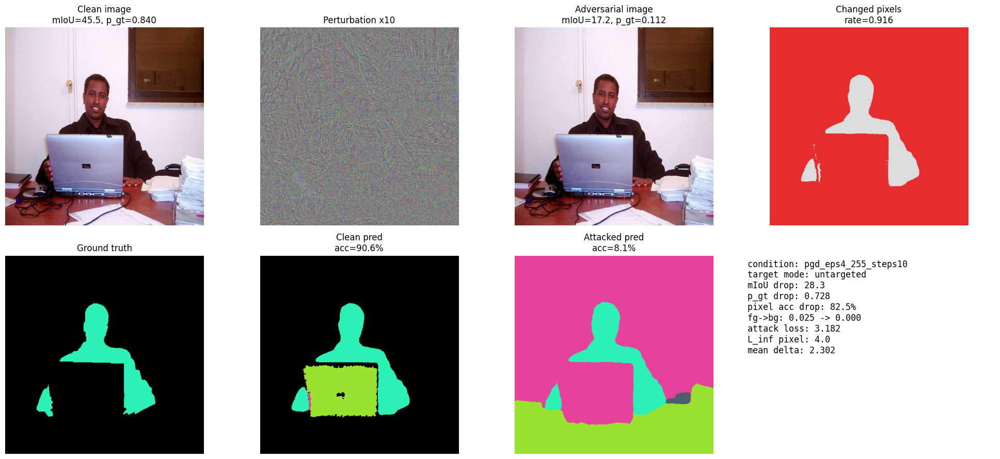

/content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/visualizations/pgd_eps4_255_steps10/attack_v10_pgd_eps4_255_steps10_example_0_train_9.png


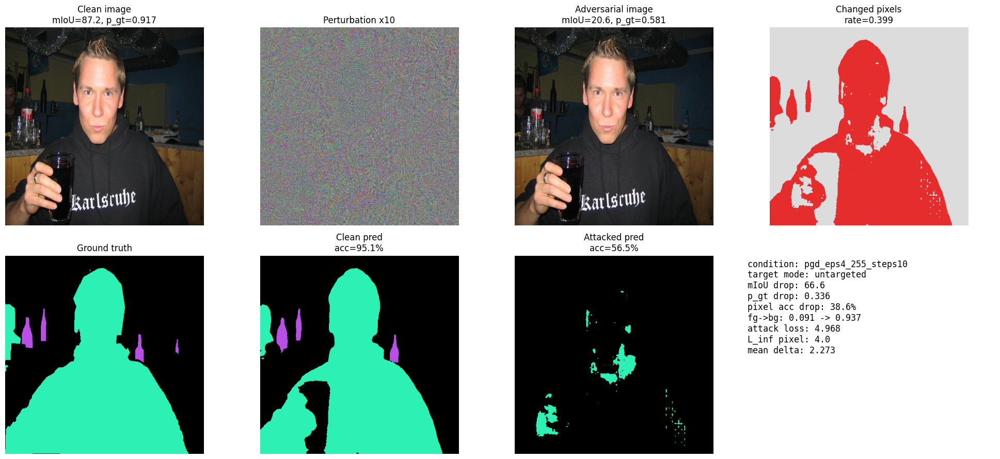

/content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/visualizations/pgd_eps4_255_steps10/attack_v10_pgd_eps4_255_steps10_example_1_train_13.png


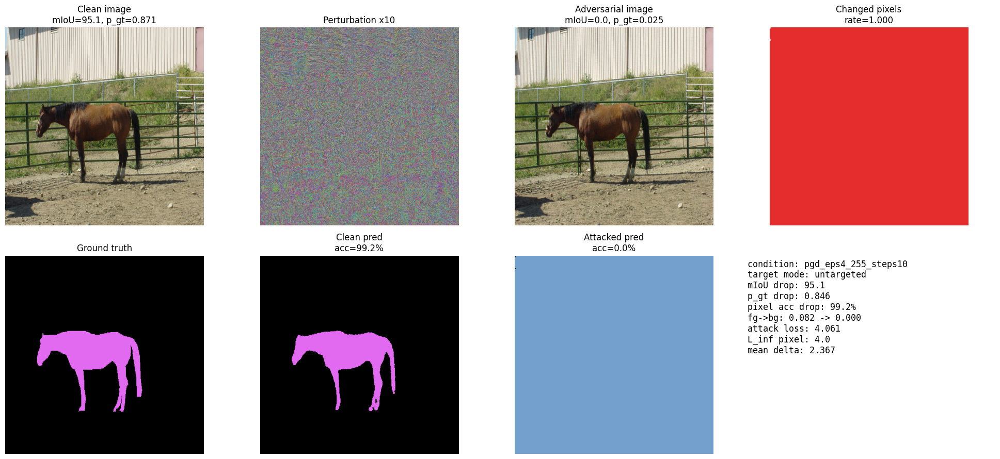

/content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/visualizations/pgd_eps4_255_steps10/attack_v10_pgd_eps4_255_steps10_example_2_train_36.png


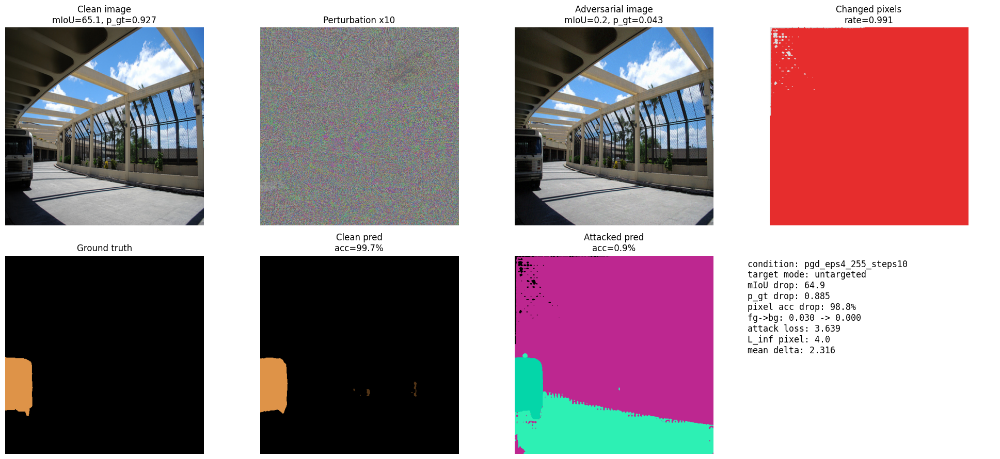

/content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/visualizations/pgd_eps4_255_steps10/attack_v10_pgd_eps4_255_steps10_example_3_train_39.png


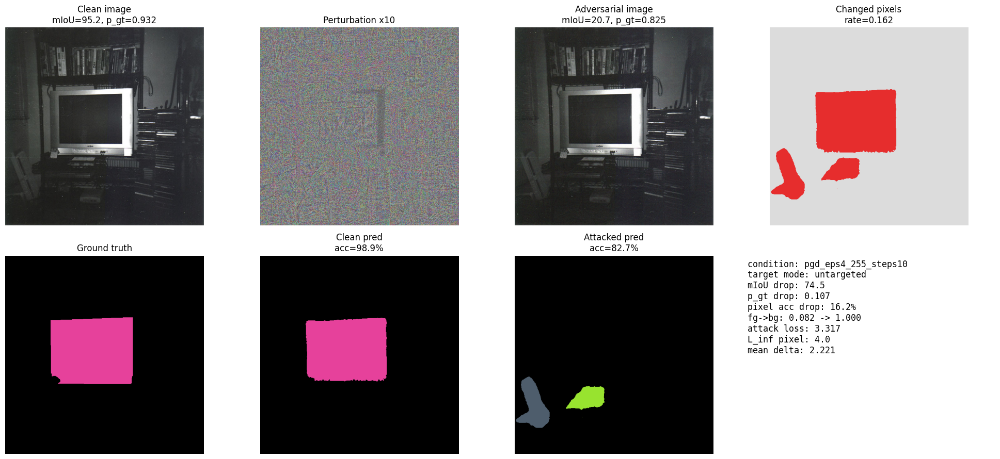

/content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/visualizations/pgd_eps4_255_steps10/attack_v10_pgd_eps4_255_steps10_example_4_train_58.png


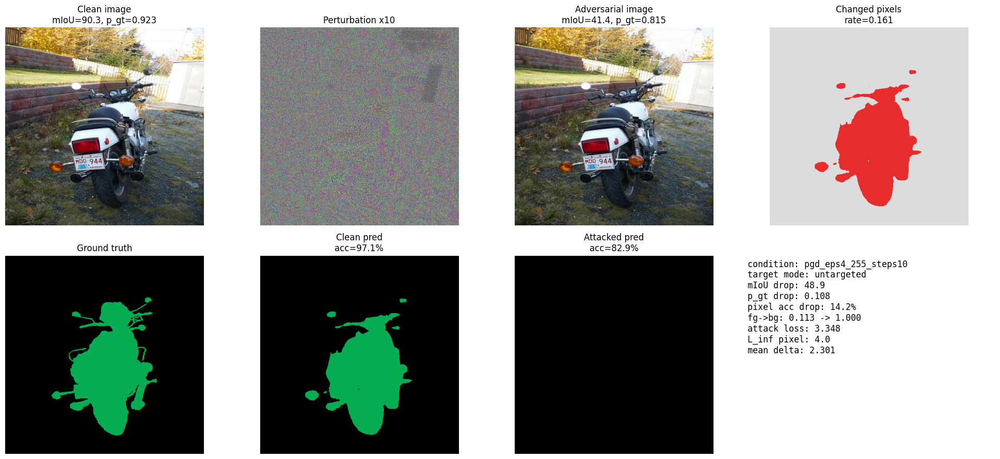

/content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/visualizations/pgd_eps4_255_steps10/attack_v10_pgd_eps4_255_steps10_example_5_train_86.png


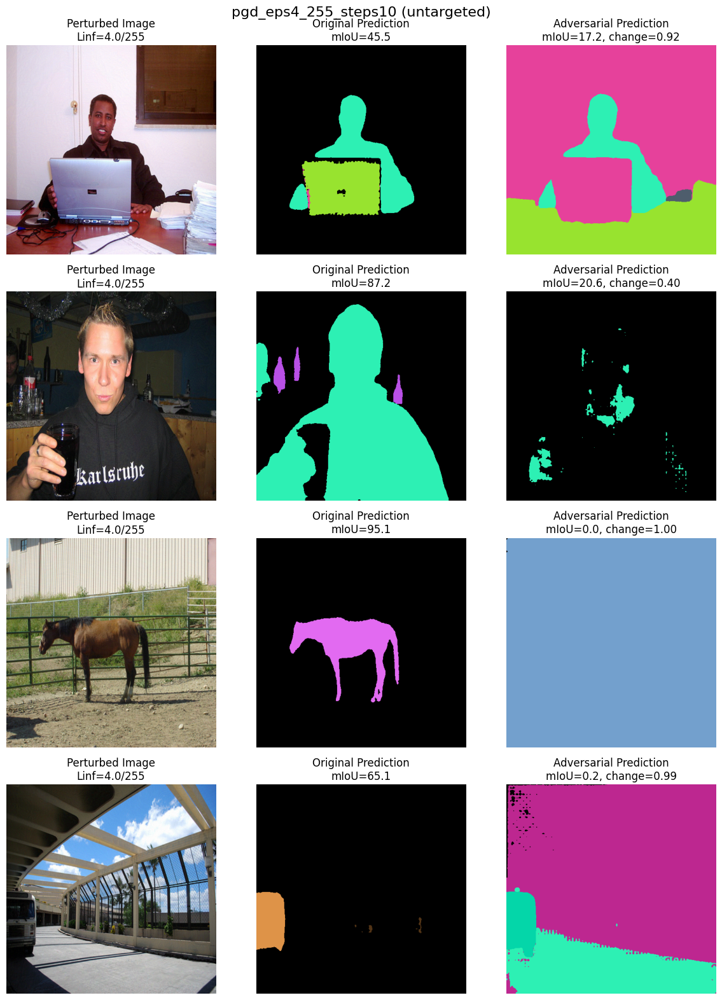

/content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/visualizations/pgd_eps4_255_steps10/report_grid_pgd_eps4_255_steps10.png
saved: /content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/visualizations/pgd_eps4_255_steps10/visualization_metrics.csv


,clean_mIoU,adv_mIoU,clean_pixel_accuracy,adv_pixel_accuracy,clean_mean_gt_probability,adv_mean_gt_probability,prediction_change_rate,clean_foreground_to_background_rate,adv_foreground_to_background_rate,stem,condition,target_mode,attack_loss,max_delta_pixel,mean_delta_pixel
0,45.513140,17.248437,90.647125,8.101654,0.839855,0.111573,0.916103,0.024754,0.000000,train_9,pgd_eps4_255_steps10,untargeted,3.182111,4.0,2.302121
1,87.157894,20.579320,95.112991,56.538773,0.916515,0.580545,0.398849,0.091184,0.936763,train_13,pgd_eps4_255_steps10,untargeted,4.967709,4.0,2.272722
2,95.068650,0.003222,99.166489,0.008774,0.871242,0.024858,0.999912,0.081580,0.000000,train_36,pgd_eps4_255_steps10,untargeted,4.060606,4.0,2.366750
3,65.113040,0.194970,99.718094,0.939941,0.927061,0.042506,0.990601,0.029935,0.000000,train_39,pgd_eps4_255_steps10,untargeted,3.638584,4.0,2.315529
4,95.213423,20.681190,98.888016,82.724762,0.932027,0.825445,0.161922,0.082062,1.000000,train_58,pgd_eps4_255_steps10,untargeted,3.316984,4.0,2.220785
5,90.347321,41.438484,97.124481,82.876968,0.923026,0.814684,0.161381,0.112728,1.000000,train_86,pgd_eps4_255_steps10,untargeted,3.348483,4.0,2.301250



Visualizing pgd_target_fg_to_bg_eps4_255_steps10...


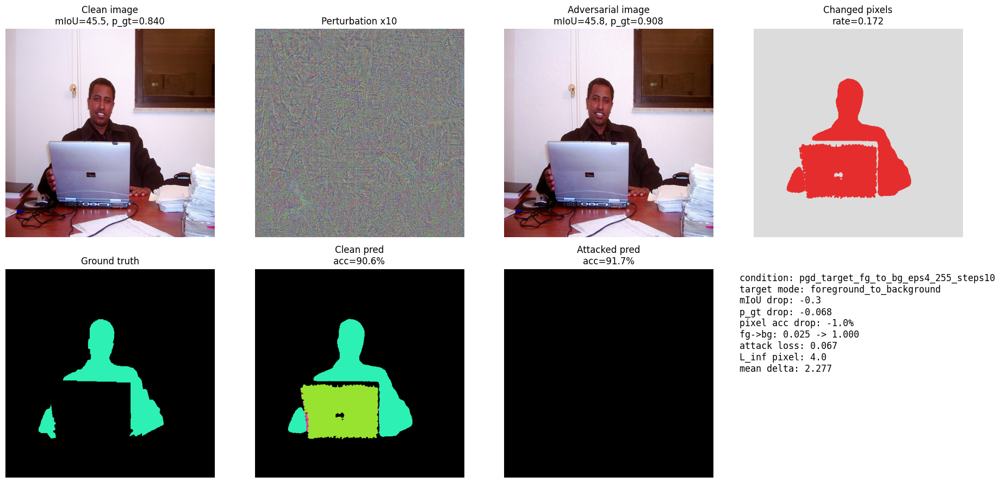

/content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/visualizations/pgd_target_fg_to_bg_eps4_255_steps10/attack_v10_pgd_target_fg_to_bg_eps4_255_steps10_example_0_train_9.png


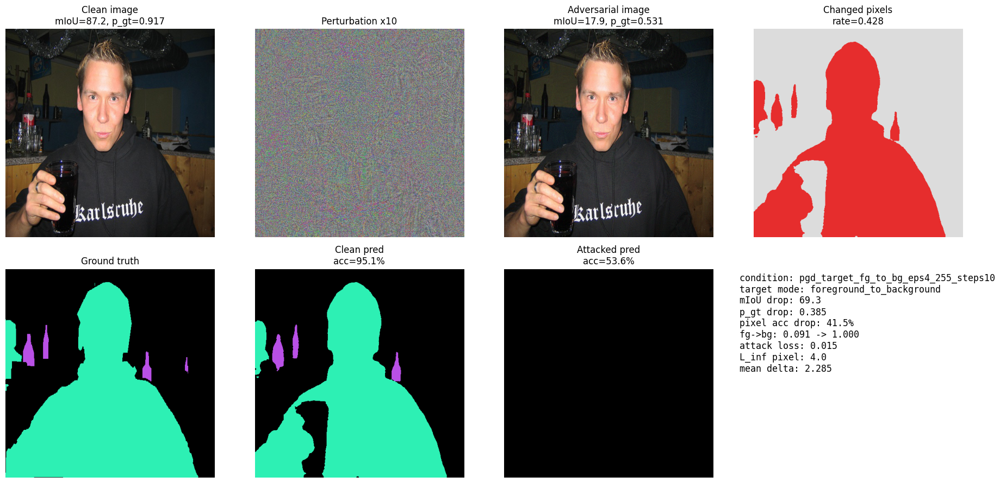

/content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/visualizations/pgd_target_fg_to_bg_eps4_255_steps10/attack_v10_pgd_target_fg_to_bg_eps4_255_steps10_example_1_train_13.png


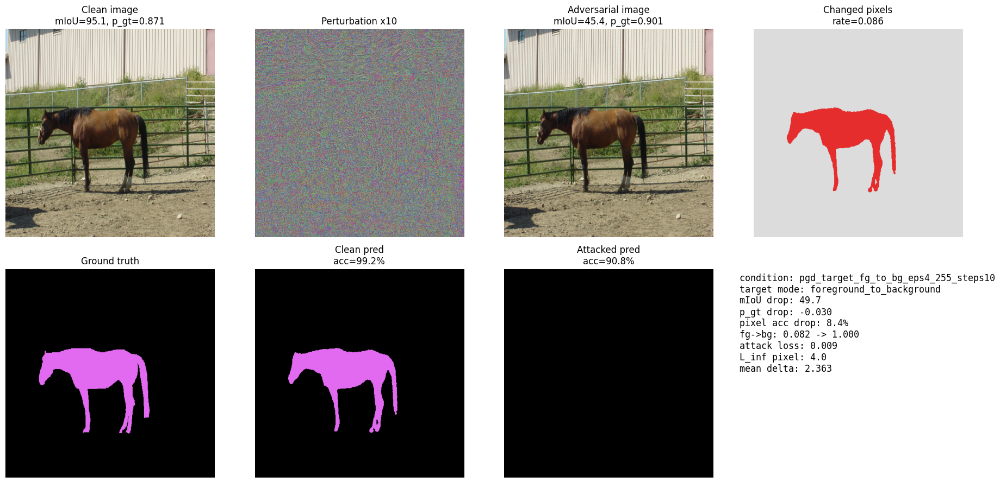

/content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/visualizations/pgd_target_fg_to_bg_eps4_255_steps10/attack_v10_pgd_target_fg_to_bg_eps4_255_steps10_example_2_train_36.png


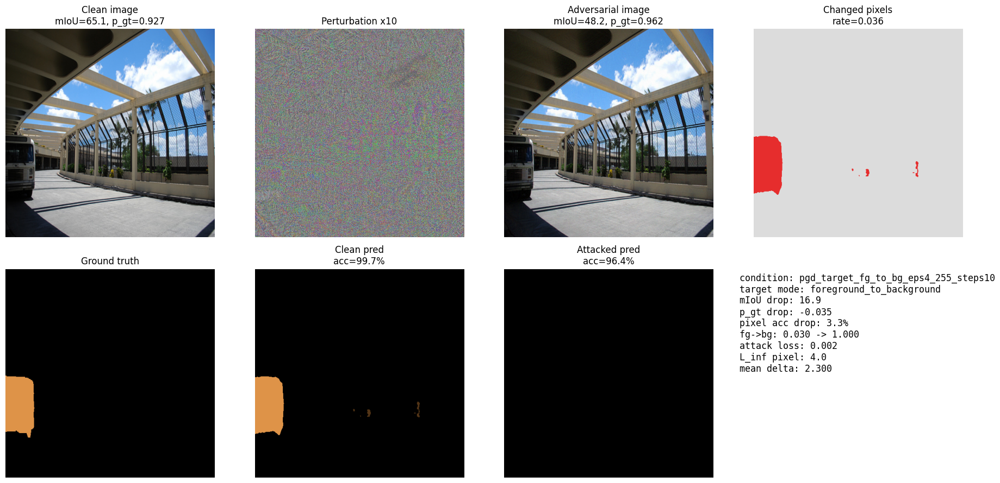

/content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/visualizations/pgd_target_fg_to_bg_eps4_255_steps10/attack_v10_pgd_target_fg_to_bg_eps4_255_steps10_example_3_train_39.png


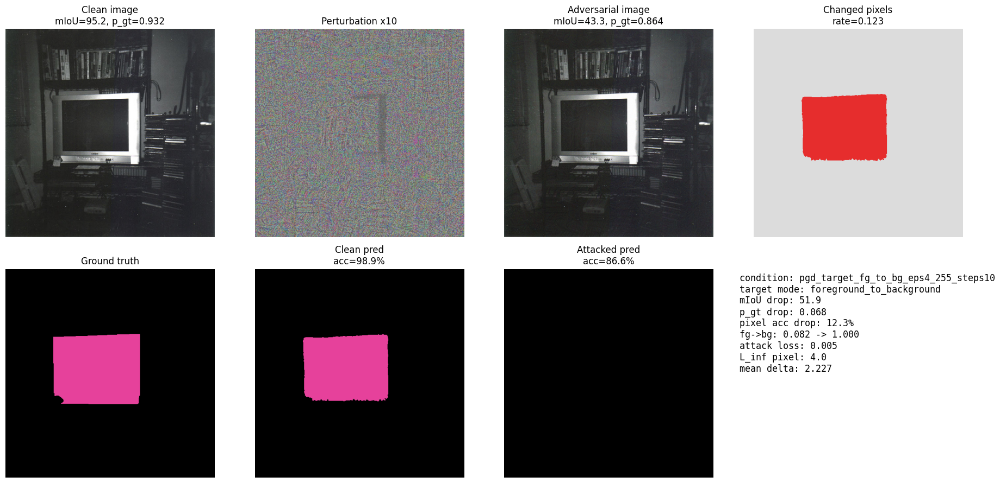

/content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/visualizations/pgd_target_fg_to_bg_eps4_255_steps10/attack_v10_pgd_target_fg_to_bg_eps4_255_steps10_example_4_train_58.png


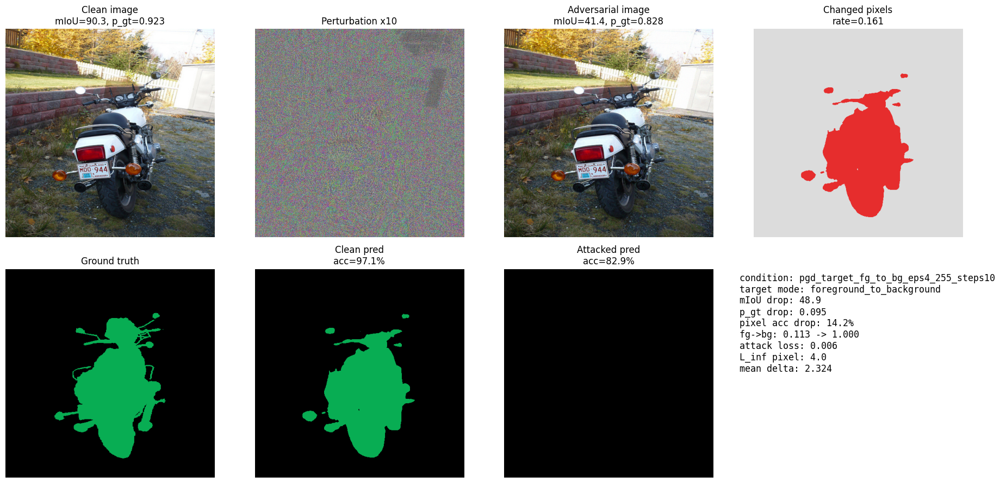

/content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/visualizations/pgd_target_fg_to_bg_eps4_255_steps10/attack_v10_pgd_target_fg_to_bg_eps4_255_steps10_example_5_train_86.png


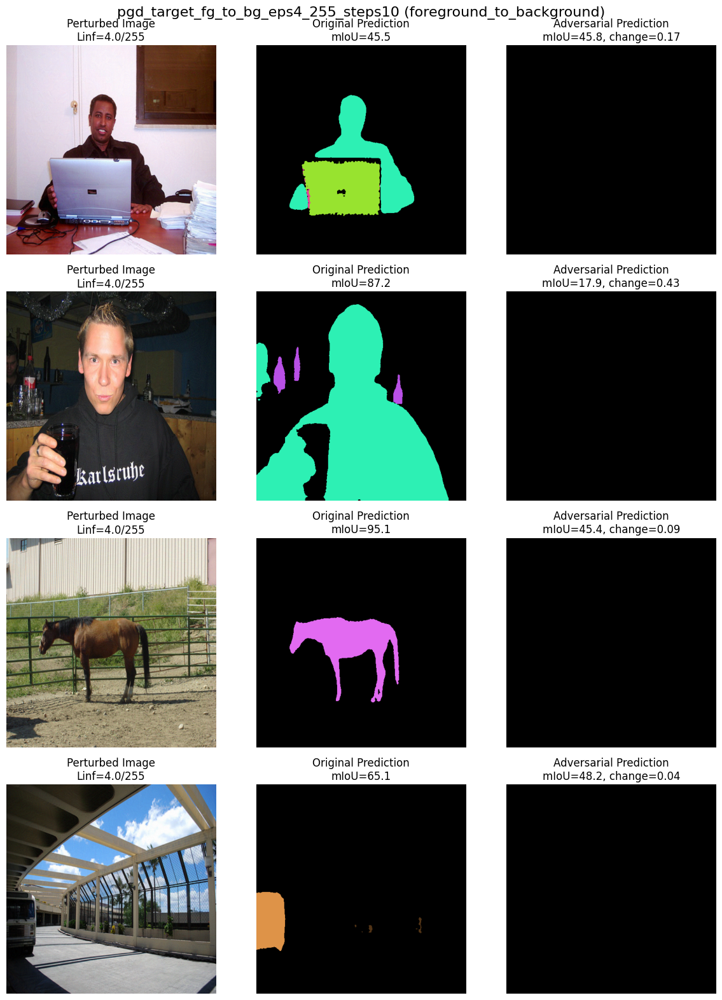

/content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/visualizations/pgd_target_fg_to_bg_eps4_255_steps10/report_grid_pgd_target_fg_to_bg_eps4_255_steps10.png
saved: /content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/visualizations/pgd_target_fg_to_bg_eps4_255_steps10/visualization_metrics.csv


,clean_mIoU,adv_mIoU,clean_pixel_accuracy,adv_pixel_accuracy,clean_mean_gt_probability,adv_mean_gt_probability,prediction_change_rate,clean_foreground_to_background_rate,adv_foreground_to_background_rate,stem,condition,target_mode,attack_loss,max_delta_pixel,mean_delta_pixel
0,45.513140,45.846939,90.647125,91.693878,0.839855,0.907888,0.172478,0.024754,1.0,train_9,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,0.067465,4.0,2.276587
1,87.157894,17.868296,95.112991,53.604889,0.916515,0.531036,0.428188,0.091184,1.0,train_13,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,0.015295,4.0,2.284744
2,95.068650,45.384789,99.166489,90.769577,0.871242,0.901037,0.085579,0.081580,1.0,train_36,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,0.009255,4.0,2.363457
3,65.113040,48.209572,99.718094,96.419144,0.927061,0.962262,0.036484,0.029935,1.0,train_39,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,0.001893,4.0,2.299857
4,95.213423,43.313026,98.888016,86.626053,0.932027,0.863838,0.122910,0.082062,1.0,train_58,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,0.004689,4.0,2.226702
5,90.347321,41.438484,97.124481,82.876968,0.923026,0.827797,0.161381,0.112728,1.0,train_86,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,0.005555,4.0,2.323953


saved: /content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17/visualizations/visualization_metrics_all.csv


,clean_mIoU,adv_mIoU,clean_pixel_accuracy,adv_pixel_accuracy,clean_mean_gt_probability,adv_mean_gt_probability,prediction_change_rate,clean_foreground_to_background_rate,adv_foreground_to_background_rate,stem,condition,target_mode,attack_loss,max_delta_pixel,mean_delta_pixel
0,45.513140,17.248437,90.647125,8.101654,0.839855,0.111573,0.916103,0.024754,0.000000,train_9,pgd_eps4_255_steps10,untargeted,3.182111,4.0,2.302121
1,87.157894,20.579320,95.112991,56.538773,0.916515,0.580545,0.398849,0.091184,0.936763,train_13,pgd_eps4_255_steps10,untargeted,4.967709,4.0,2.272722
2,95.068650,0.003222,99.166489,0.008774,0.871242,0.024858,0.999912,0.081580,0.000000,train_36,pgd_eps4_255_steps10,untargeted,4.060606,4.0,2.366750
3,65.113040,0.194970,99.718094,0.939941,0.927061,0.042506,0.990601,0.029935,0.000000,train_39,pgd_eps4_255_steps10,untargeted,3.638584,4.0,2.315529
4,95.213423,20.681190,98.888016,82.724762,0.932027,0.825445,0.161922,0.082062,1.000000,train_58,pgd_eps4_255_steps10,untargeted,3.316984,4.0,2.220785
5,90.347321,41.438484,97.124481,82.876968,0.923026,0.814684,0.161381,0.112728,1.000000,train_86,pgd_eps4_255_steps10,untargeted,3.348483,4.0,2.301250
6,45.513140,45.846939,90.647125,91.693878,0.839855,0.907888,0.172478,0.024754,1.000000,train_9,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,0.067465,4.0,2.276587
7,87.157894,17.868296,95.112991,53.604889,0.916515,0.531036,0.428188,0.091184,1.000000,train_13,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,0.015295,4.0,2.284744
8,95.068650,45.384789,99.166489,90.769577,0.871242,0.901037,0.085579,0.081580,1.000000,train_36,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,0.009255,4.0,2.363457
9,65.113040,48.209572,99.718094,96.419144,0.927061,0.962262,0.036484,0.029935,1.000000,train_39,pgd_target_fg_to_bg_eps4_255_steps10,foreground_to_background,0.001893,4.0,2.299857


In [ ]:
# Visualize untargeted + targeted PGD results.
# Outputs:
# 1. detailed per-image figures
# 2. compact report-style grids

def image_to_uint8(image_tensor):
    arr = image_tensor.detach().cpu().permute(1, 2, 0).numpy()
    return np.clip(arr, 0, 255).astype(np.uint8)


def delta_to_vis_x10(delta_tensor):
    arr = delta_tensor.detach().cpu().permute(1, 2, 0).numpy() / 255.0
    return np.clip((0.5 + 10.0 * arr) * 255.0, 0, 255).astype(np.uint8)


def colorize(mask_tensor):
    mask = mask_tensor.detach().cpu().numpy().astype(np.int64)
    palette = np.array(PALETTE, dtype=np.uint8)
    out = np.zeros((*mask.shape, 3), dtype=np.uint8)
    valid = (mask >= 0) & (mask < len(palette))
    out[valid] = palette[mask[valid]]
    return out


def change_to_vis(clean_pred, adv_pred, mask):
    clean_np = clean_pred.detach().cpu().numpy()
    adv_np = adv_pred.detach().cpu().numpy()
    valid_np = (mask.detach().cpu().numpy() != IGNORE_INDEX)
    changed = (clean_np != adv_np) & valid_np
    out = np.zeros((*changed.shape, 3), dtype=np.uint8)
    out[..., :] = 35
    out[changed] = np.array([230, 45, 45], dtype=np.uint8)
    out[valid_np & ~changed] = np.array([220, 220, 220], dtype=np.uint8)
    return out


def single_image_report_metrics(clean_scores, adv_scores, clean_pred, adv_pred, mask):
    valid = mask != IGNORE_INDEX
    valid_count = valid.sum().detach().cpu().item()

    clean_inter, clean_union = intersection_union(clean_pred.unsqueeze(0), mask.unsqueeze(0))
    adv_inter, adv_union = intersection_union(adv_pred.unsqueeze(0), mask.unsqueeze(0))
    clean_miou, _ = summarize_miou(clean_inter, clean_union)
    adv_miou, _ = summarize_miou(adv_inter, adv_union)

    clean_correct, _, clean_gt_prob = accumulate_prediction_stats(
        clean_scores, clean_pred.unsqueeze(0), mask.unsqueeze(0)
    )
    adv_correct, _, adv_gt_prob = accumulate_prediction_stats(
        adv_scores, adv_pred.unsqueeze(0), mask.unsqueeze(0)
    )

    clean_fg_to_bg, foreground_pixels = accumulate_foreground_to_background_stats(
        clean_pred.unsqueeze(0), mask.unsqueeze(0)
    )
    adv_fg_to_bg, _ = accumulate_foreground_to_background_stats(
        adv_pred.unsqueeze(0), mask.unsqueeze(0)
    )

    changed = ((clean_pred != adv_pred) & valid).sum().detach().cpu().item()

    if valid_count <= 0:
        return {
            "clean_mIoU": clean_miou,
            "adv_mIoU": adv_miou,
            "clean_pixel_accuracy": 0.0,
            "adv_pixel_accuracy": 0.0,
            "clean_mean_gt_probability": 0.0,
            "adv_mean_gt_probability": 0.0,
            "prediction_change_rate": 0.0,
            "clean_foreground_to_background_rate": 0.0,
            "adv_foreground_to_background_rate": 0.0,
        }

    clean_fg_to_bg_rate = clean_fg_to_bg / foreground_pixels if foreground_pixels > 0 else 0.0
    adv_fg_to_bg_rate = adv_fg_to_bg / foreground_pixels if foreground_pixels > 0 else 0.0

    return {
        "clean_mIoU": clean_miou,
        "adv_mIoU": adv_miou,
        "clean_pixel_accuracy": 100.0 * clean_correct / valid_count,
        "adv_pixel_accuracy": 100.0 * adv_correct / valid_count,
        "clean_mean_gt_probability": clean_gt_prob / valid_count,
        "adv_mean_gt_probability": adv_gt_prob / valid_count,
        "prediction_change_rate": changed / valid_count,
        "clean_foreground_to_background_rate": clean_fg_to_bg_rate,
        "adv_foreground_to_background_rate": adv_fg_to_bg_rate,
    }


def collect_visual_examples(vis_cfg, max_examples=6):
    rows = []
    examples = []

    for out_idx, dataset_idx in enumerate(range(min(max_examples, len(val_attack_dataset)))):
        item = val_attack_dataset[dataset_idx]
        image = item["image"].unsqueeze(0).to(DEVICE)
        mask = item["mask"].unsqueeze(0).to(DEVICE)

        adv_image, delta, attack_loss = make_adversarial(image, mask, vis_cfg)

        with torch.no_grad():
            clean_scores, _ = target_scores(image, need_features=False)
            adv_scores, _ = target_scores(adv_image, need_features=False)
            clean_pred = clean_scores.argmax(dim=1)[0]
            adv_pred = adv_scores.argmax(dim=1)[0]

        metrics = single_image_report_metrics(
            clean_scores, adv_scores, clean_pred, adv_pred, mask[0]
        )
        metrics.update({
            "stem": item["stem"],
            "condition": vis_cfg["condition"],
            "target_mode": vis_cfg.get("target_mode", "untargeted"),
            "attack_loss": attack_loss,
            "max_delta_pixel": float(delta.abs().max().detach().cpu()),
            "mean_delta_pixel": float(delta.abs().mean().detach().cpu()),
        })

        rows.append(metrics)
        examples.append({
            "idx": out_idx,
            "stem": item["stem"],
            "image": image[0].detach().cpu(),
            "adv_image": adv_image[0].detach().cpu(),
            "delta": delta[0].detach().cpu(),
            "mask": mask[0].detach().cpu(),
            "clean_pred": clean_pred.detach().cpu(),
            "adv_pred": adv_pred.detach().cpu(),
            "metrics": metrics,
        })

    return rows, examples


def save_detailed_figures(vis_cfg, examples, vis_dir):
    for ex in examples:
        metrics = ex["metrics"]

        fig, axes = plt.subplots(2, 4, figsize=(20, 9))
        axes = axes.reshape(2, 4)

        axes[0, 0].imshow(image_to_uint8(ex["image"]))
        axes[0, 0].set_title(
            f"Clean image\nmIoU={metrics['clean_mIoU']:.1f}, "
            f"p_gt={metrics['clean_mean_gt_probability']:.3f}"
        )

        axes[0, 1].imshow(delta_to_vis_x10(ex["delta"]))
        axes[0, 1].set_title("Perturbation x10")

        axes[0, 2].imshow(image_to_uint8(ex["adv_image"]))
        axes[0, 2].set_title(
            f"Adversarial image\nmIoU={metrics['adv_mIoU']:.1f}, "
            f"p_gt={metrics['adv_mean_gt_probability']:.3f}"
        )

        axes[0, 3].imshow(change_to_vis(ex["clean_pred"], ex["adv_pred"], ex["mask"]))
        axes[0, 3].set_title(
            f"Changed pixels\nrate={metrics['prediction_change_rate']:.3f}"
        )

        axes[1, 0].imshow(colorize(ex["mask"]))
        axes[1, 0].set_title("Ground truth")

        axes[1, 1].imshow(colorize(ex["clean_pred"]))
        axes[1, 1].set_title(f"Clean pred\nacc={metrics['clean_pixel_accuracy']:.1f}%")

        axes[1, 2].imshow(colorize(ex["adv_pred"]))
        axes[1, 2].set_title(f"Attacked pred\nacc={metrics['adv_pixel_accuracy']:.1f}%")

        axes[1, 3].axis("off")
        axes[1, 3].text(
            0.02,
            0.98,
            "\n".join([
                f"condition: {vis_cfg['condition']}",
                f"target mode: {vis_cfg.get('target_mode', 'untargeted')}",
                f"mIoU drop: {metrics['clean_mIoU'] - metrics['adv_mIoU']:.1f}",
                f"p_gt drop: {metrics['clean_mean_gt_probability'] - metrics['adv_mean_gt_probability']:.3f}",
                f"pixel acc drop: {metrics['clean_pixel_accuracy'] - metrics['adv_pixel_accuracy']:.1f}%",
                f"fg->bg: {metrics['clean_foreground_to_background_rate']:.3f} -> {metrics['adv_foreground_to_background_rate']:.3f}",
                f"attack loss: {metrics['attack_loss']:.3f}",
                f"L_inf pixel: {metrics['max_delta_pixel']:.1f}",
                f"mean delta: {metrics['mean_delta_pixel']:.3f}",
            ]),
            va="top",
            ha="left",
            fontsize=12,
            family="monospace",
        )

        for ax in axes.flatten()[:7]:
            ax.axis("off")

        fig.tight_layout()
        out_path = vis_dir / f"attack_v10_{vis_cfg['condition']}_example_{ex['idx']}_{ex['stem']}.png"
        fig.savefig(out_path, dpi=160)
        plt.show()
        print(out_path)


def save_report_grid(vis_cfg, examples, vis_dir, max_examples=4):
    examples = examples[:max_examples]
    n = len(examples)
    if n == 0:
        return

    fig, axes = plt.subplots(n, 3, figsize=(12, 4 * n))
    if n == 1:
        axes = np.expand_dims(axes, axis=0)

    for row, ex in enumerate(examples):
        metrics = ex["metrics"]

        axes[row, 0].imshow(image_to_uint8(ex["adv_image"]))
        axes[row, 0].set_title(
            f"Perturbed Image\nLinf={metrics['max_delta_pixel']:.1f}/255"
        )

        axes[row, 1].imshow(colorize(ex["clean_pred"]))
        axes[row, 1].set_title(
            f"Original Prediction\nmIoU={metrics['clean_mIoU']:.1f}"
        )

        axes[row, 2].imshow(colorize(ex["adv_pred"]))
        axes[row, 2].set_title(
            f"Adversarial Prediction\nmIoU={metrics['adv_mIoU']:.1f}, "
            f"change={metrics['prediction_change_rate']:.2f}"
        )

        for col in range(3):
            axes[row, col].axis("off")

    fig.suptitle(
        f"{vis_cfg['condition']} ({vis_cfg.get('target_mode', 'untargeted')})",
        fontsize=16,
    )
    fig.tight_layout()
    out_path = vis_dir / f"report_grid_{vis_cfg['condition']}.png"
    fig.savefig(out_path, dpi=180)
    plt.show()
    print(out_path)


VIS_CONDITIONS = [
    "pgd_eps4_255_steps10",
    "pgd_target_fg_to_bg_eps4_255_steps10",
]

VIS_CONFIGS = [cfg for cfg in ATTACK_CONFIGS if cfg["condition"] in VIS_CONDITIONS]

if len(VIS_CONFIGS) != len(VIS_CONDITIONS):
    found = [cfg["condition"] for cfg in VIS_CONFIGS]
    print("Warning: not all requested visual configs were found.")
    print("Requested:", VIS_CONDITIONS)
    print("Found:", found)

all_visual_rows = []

for vis_cfg in VIS_CONFIGS:
    print(f"\nVisualizing {vis_cfg['condition']}...")
    vis_dir = OUTPUT_DIR / "visualizations" / vis_cfg["condition"]
    vis_dir.mkdir(parents=True, exist_ok=True)

    visual_rows, examples = collect_visual_examples(vis_cfg, max_examples=6)
    all_visual_rows.extend(visual_rows)

    save_detailed_figures(vis_cfg, examples, vis_dir)
    save_report_grid(vis_cfg, examples, vis_dir, max_examples=4)

    visual_metrics = pd.DataFrame(visual_rows)
    visual_metrics.to_csv(vis_dir / "visualization_metrics.csv", index=False)
    print("saved:", vis_dir / "visualization_metrics.csv")
    display(visual_metrics)

all_visual_metrics = pd.DataFrame(all_visual_rows)
all_visual_metrics.to_csv(OUTPUT_DIR / "visualizations" / "visualization_metrics_all.csv", index=False)
print("saved:", OUTPUT_DIR / "visualizations" / "visualization_metrics_all.csv")
display(all_visual_metrics)


In [ ]:
%%bash
SRC="/content/CV-Assignment2-Group6/Semantic segmentation/outputs/attacks/attack_v10_fgsm_pgd_eomt_v17"
DST="/content/drive/MyDrive/CV_Assignment_Outputs/adversarial_attack_v10_fgsm_pgd_eomt_v17"

mkdir -p "$DST"
cp -r "$SRC"/. "$DST"/

echo "Backup complete!"


Backup complete!
